# Data Import

In [3]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas
from wordcloud import WordCloud

pd.set_option("mode.copy_on_write", True)
sns.set_theme()
sns.set_style("white")
%config InlineBackend.figure_format = "retina"

jobs_df = pd.read_pickle("../Data Mining/data/jobs.pkl")
# display(jobs_df.columns)

Index(['Titel', 'Unternehmen', 'Ort', 'Gehalt_min', 'Gehalt_max', 'JobID',
       'Link', 'Datum', 'Teilzeit_Remote', 'Introduction', 'Description',
       'Profile', 'We_offer', 'Contact'],
      dtype='object')

# Data Cleaning

In [4]:
jobs_df["Gehalt_min"] = pd.to_numeric(jobs_df["Gehalt_min"], errors="coerce").astype(
    "Int64"
)
jobs_df["Gehalt_max"] = pd.to_numeric(jobs_df["Gehalt_max"], errors="coerce").astype(
    "Int64"
)
jobs_df["JobID"] = jobs_df["JobID"].astype("Int64")

# display(jobs_df.info())

In [5]:
# Säubere Link Format, um Duplikate besser erkennen zu können
jobs_df["Link"] = jobs_df["Link"].str.rsplit("?&cid", n=1, expand=True)[0]

# Entferne Duplikate
jobs_no_dups = jobs_df.drop_duplicates(subset=["Link"])

In [6]:
# Filter nach Jobs, die bestimmte Schlagwörter im Titel oder Beschreibungstext haben
keywords = ["data", "analy", "daten"]


def check_keyword(string):
    for word in keywords:
        if word in string.lower():
            return True
    return False


jobs_relevant = jobs_no_dups[jobs_no_dups["Titel"].apply(check_keyword)]

In [7]:
# jobs_no_dups[jobs_no_dups["Datum"] == "2023-11-08"]

In [8]:
# jobs_no_dups[~jobs_no_dups.index.isin(jobs_relevant.index)].sample(20)

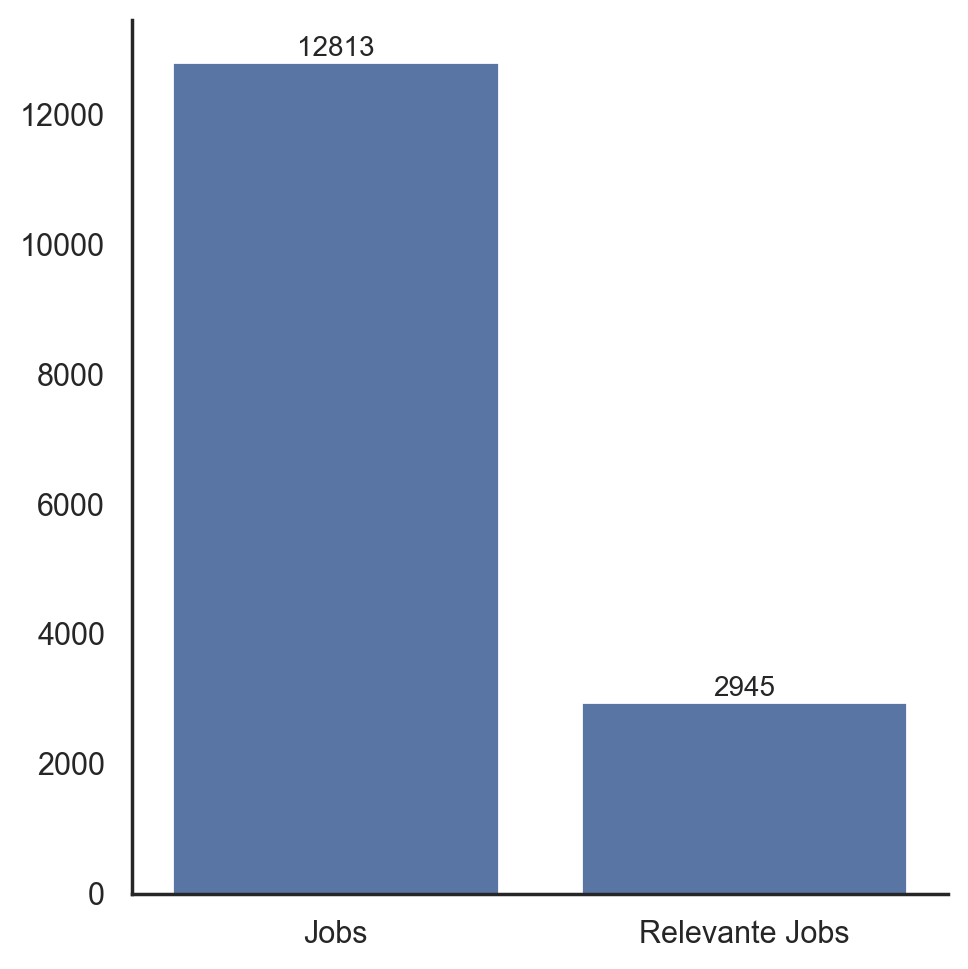

In [9]:
g = sns.catplot(data=[len(jobs_df), len(jobs_relevant)], kind="bar")
g.set_xticklabels(["Jobs", "Relevante Jobs"])
ax = g.facet_axis(0, 0)
ax.bar_label(ax.containers[0], fontsize=10)
plt.show()

# EDA

In [50]:
# Zeitumfang und Remote Spalten erstellen
# print(jobs_relevant["Teilzeit_Remote"].unique())
verfügbar = ~jobs_relevant["Teilzeit_Remote"].isin(
    ["Stellenanzeige nicht mehr verfügbar", "-", "Nicht stepstone"]
)
jobs_relevant["Vollzeit"] = jobs_relevant.loc[verfügbar, "Teilzeit_Remote"].apply(
    lambda x: "Vollzeit" in x
)
jobs_relevant["Teilzeit"] = jobs_relevant.loc[verfügbar, "Teilzeit_Remote"].apply(
    lambda x: "Teilzeit" in x
)
jobs_relevant["Zeit flexibel"] = jobs_relevant["Vollzeit"] & jobs_relevant["Teilzeit"]
jobs_relevant["Remote"] = jobs_relevant.loc[verfügbar, "Teilzeit_Remote"].apply(
    lambda x: "Home Office möglich" in x
)

jobs_relevant[["Vollzeit", "Teilzeit", "Zeit flexibel", "Remote"]] = jobs_relevant[
    ["Vollzeit", "Teilzeit", "Zeit flexibel", "Remote"]
].astype("bool")

In [51]:
# Erstelle Job Kategorien
data_science_roles = {
    "Management/Teamlead": ["manag", "teamlead", "team lead", "head of", "teamleit"],
    "Praktikum/Student": ["praktik", "student", "studium"],
    "Trainee": ["trainee"],
    "Product Owner": ["product owner"],
    "Consultant": ["consult"],
    "Data Scientist": ["scien", "wissenschaft"],
    "Data Engineer": ["engineer"],
    "Data Analyst": ["analy"],
    "Data Architekt": ["archite"],
    "Data Warehouse": ["warehouse"],
    "Systemadministrator": ["systemadmin", "system admin"],
    "Datenbank": ["datenbank", "database"],
    "Data Protection": ["protection", "privacy", "datenschutz", "security"],
}


def role(title):
    for role, keywords in data_science_roles.items():
        for word in keywords:
            if word in title.lower():
                return role
    return "Andere"


jobs_relevant["Job Kategorie"] = jobs_relevant["Titel"].apply(role)
non_classified_jobs = jobs_relevant[jobs_relevant["Job Kategorie"] == "Andere"]

jobs_relevant["Job Kategorie"] = jobs_relevant["Job Kategorie"].astype("category")

# jobs_relevant["Job Kategorie"].value_counts()

## Job Kategorien

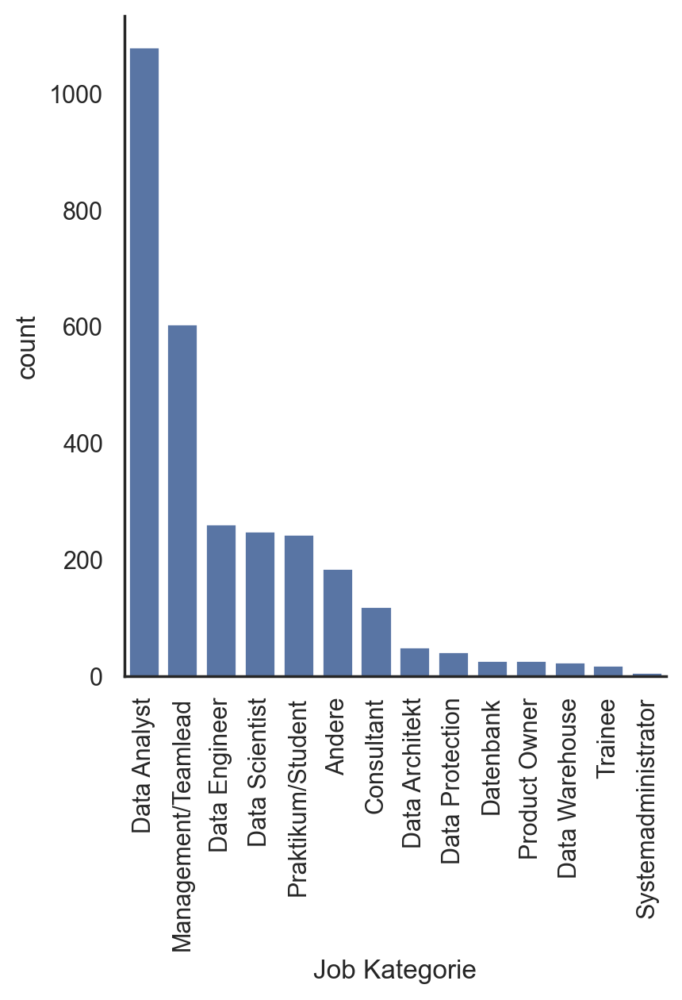

In [52]:
g = sns.catplot(
    data=jobs_relevant,
    x="Job Kategorie",
    kind="count",
    order=jobs_relevant["Job Kategorie"].value_counts().index,
)
plt.xticks(rotation=90)

h = sns.catplot
plt.show()

In [53]:
jobs_scientist_analyst = jobs_relevant[
    jobs_relevant["Job Kategorie"].isin(["Data Analyst", "Data Scientist"])
]
jobs_scientist_analyst["Job Kategorie"] = jobs_scientist_analyst[
    "Job Kategorie"
].cat.remove_unused_categories()
# jobs_scientist_analyst

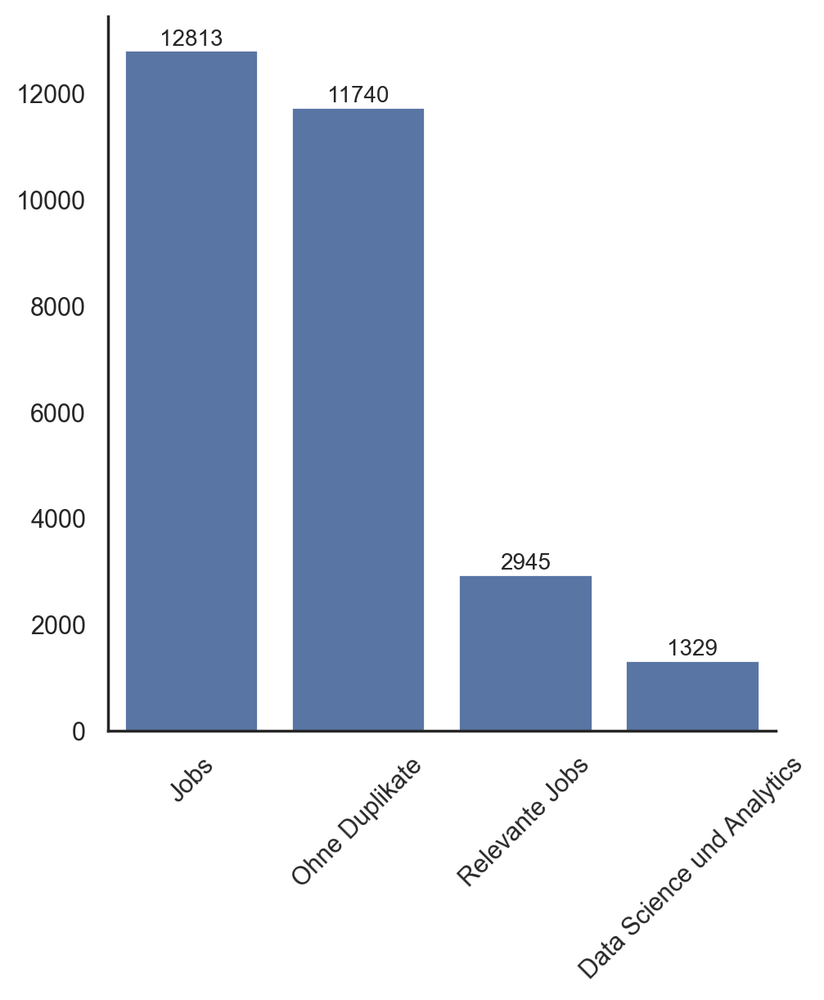

In [54]:
g = sns.catplot(
    data=[
        len(jobs_df),
        len(jobs_no_dups),
        len(jobs_relevant),
        len(jobs_scientist_analyst),
    ],
    kind="bar",
)
g.set_xticklabels(
    ["Jobs", "Ohne Duplikate", "Relevante Jobs", "Data Science und Analytics"],
    rotation=45,
)
ax = g.facet_axis(0, 0)
ax.bar_label(ax.containers[0], fontsize=10)
plt.show()

## Junior Role

In [55]:
jobs_scientist_analyst["Junior"] = jobs_scientist_analyst["Titel"].apply(
    lambda x: "junior" in x.lower()
)
jobs_scientist_analyst["Junior"] = jobs_scientist_analyst["Junior"].astype("bool")
# jobs_scientist_analyst[jobs_scientist_analyst["Junior"]]

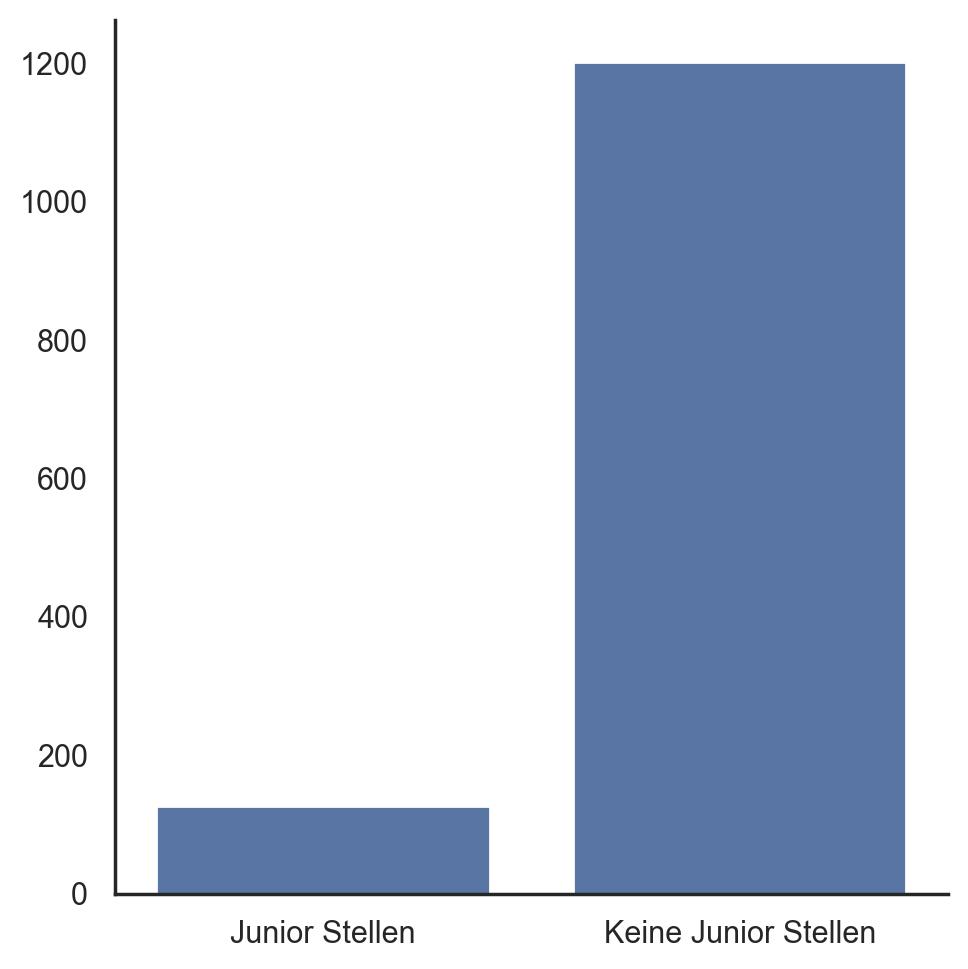

126 Junior Stellen, 1203 Andere


In [56]:
g = sns.catplot(
    data=[
        len(jobs_scientist_analyst[jobs_scientist_analyst["Junior"]]),
        len(jobs_scientist_analyst[~jobs_scientist_analyst["Junior"]]),
    ],
    kind="bar",
)
g.set_xticklabels(["Junior Stellen", "Keine Junior Stellen"])
plt.show()

print(
    "{} Junior Stellen, {} Andere".format(
        len(jobs_scientist_analyst[jobs_scientist_analyst["Junior"] == True]),  # noqa: E712
        len(jobs_scientist_analyst[~jobs_scientist_analyst["Junior"]]),
    )
)

## Teilzeit, Vollzeit, Flexibel

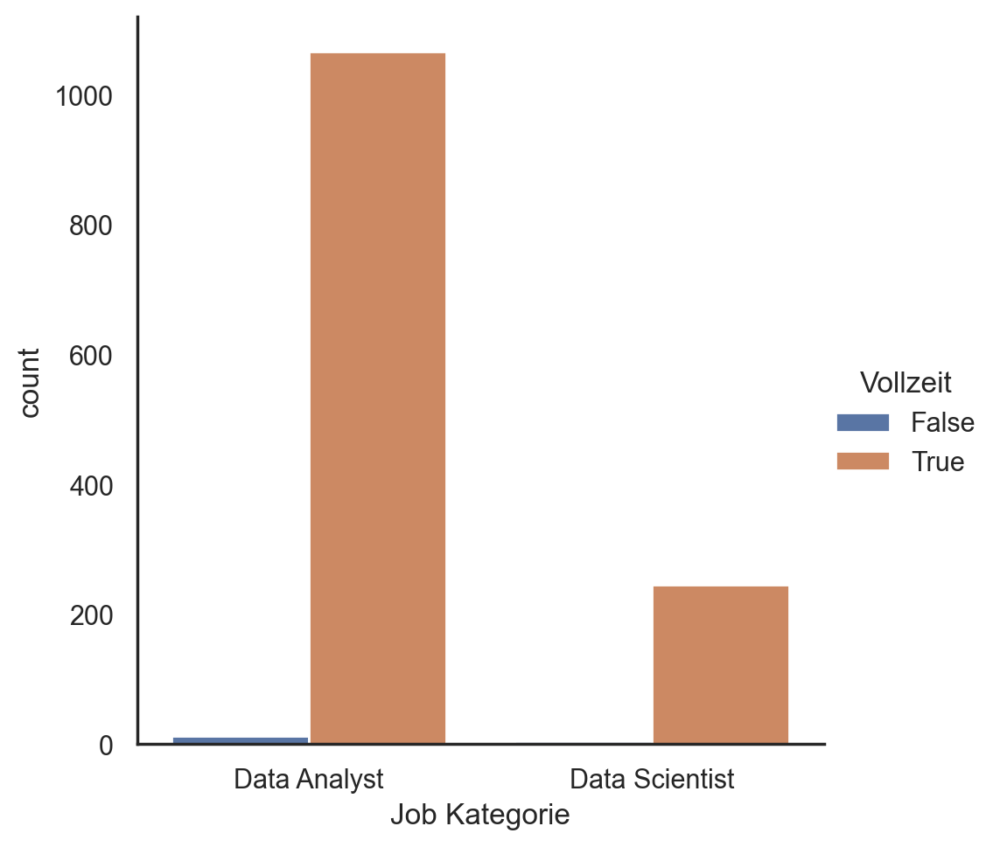

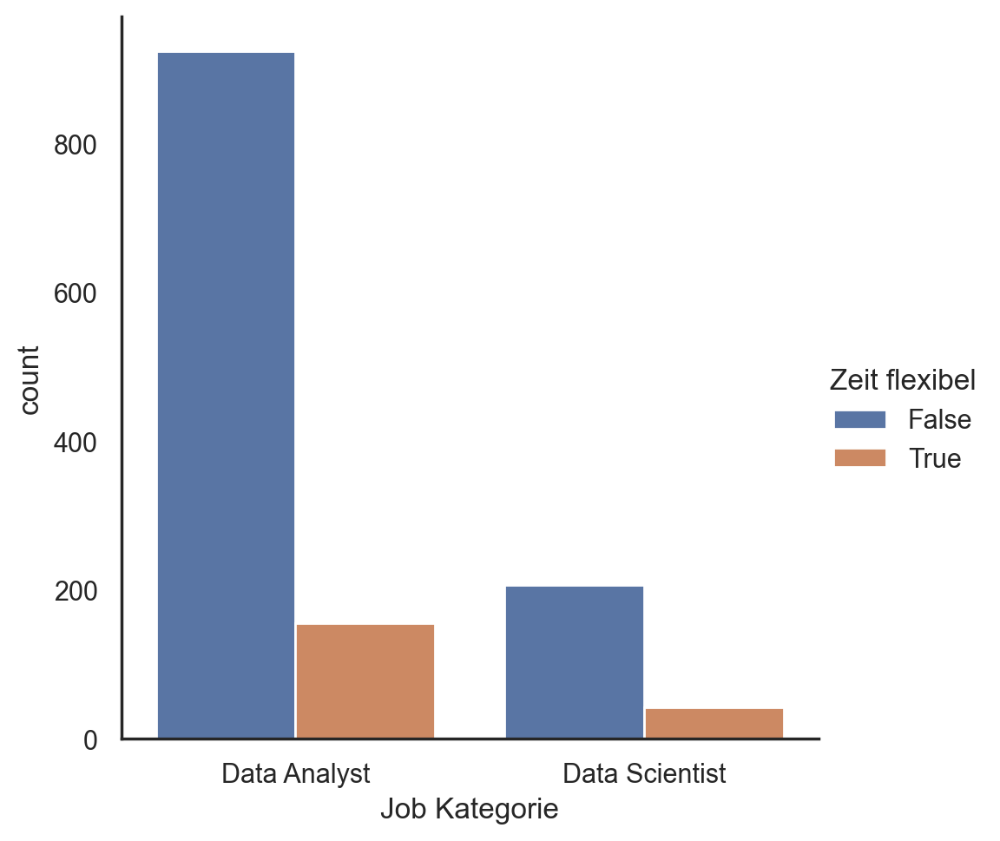

In [57]:
g = sns.catplot(
    data=jobs_scientist_analyst,
    x="Job Kategorie",
    order=["Data Analyst", "Data Scientist"],
    kind="count",
    hue="Vollzeit",
)
h = sns.catplot(
    data=jobs_scientist_analyst,
    x="Job Kategorie",
    order=["Data Analyst", "Data Scientist"],
    kind="count",
    hue="Zeit flexibel",
)

plt.show()

## Gehalt

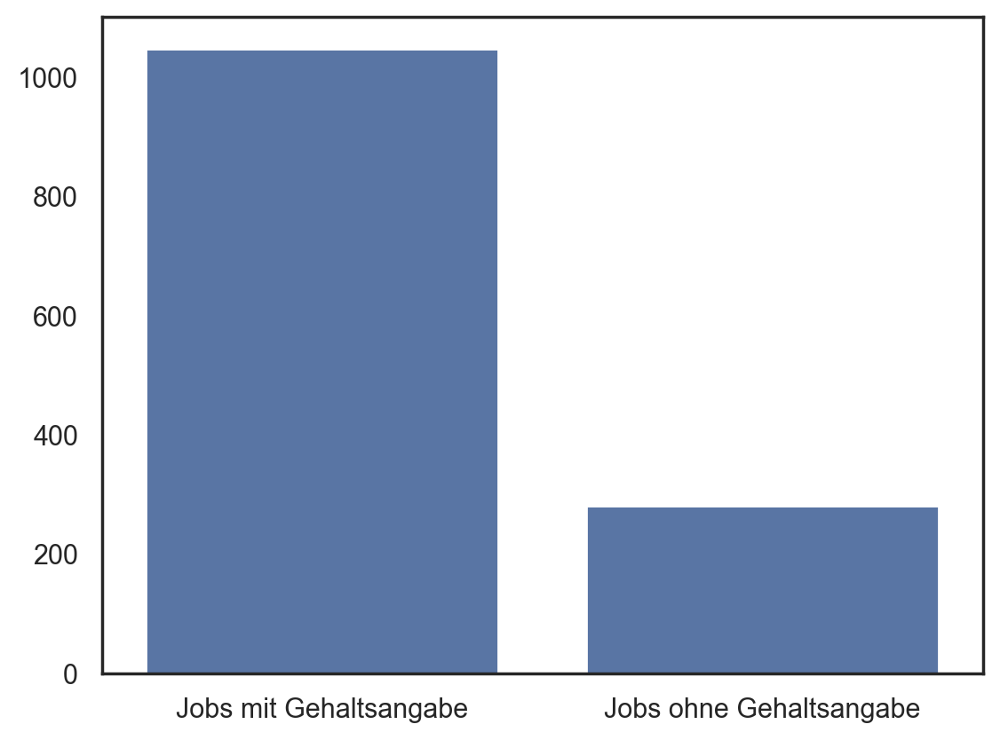

In [58]:
jobs_ohne_gehalt = jobs_scientist_analyst[jobs_scientist_analyst["Gehalt_min"].isna()]
jobs_mit_gehalt = jobs_scientist_analyst[jobs_scientist_analyst["Gehalt_min"].notna()]

g = sns.barplot(
    y=[len(jobs_mit_gehalt), len(jobs_ohne_gehalt)],
    x=["Jobs mit Gehaltsangabe", "Jobs ohne Gehaltsangabe"],
)
plt.show()

In [59]:
jobs_scientist_analyst["Gehalt_min_yearly"] = jobs_scientist_analyst["Gehalt_min"] * 12
jobs_scientist_analyst["Gehalt_max_yearly"] = jobs_scientist_analyst["Gehalt_max"] * 12
jobs_scientist_analyst["Gehalt_durchschnitt_yearly"] = (
    jobs_scientist_analyst["Gehalt_min_yearly"]
    + jobs_scientist_analyst["Gehalt_max_yearly"]
) / 2

### Min / Max Gehalt

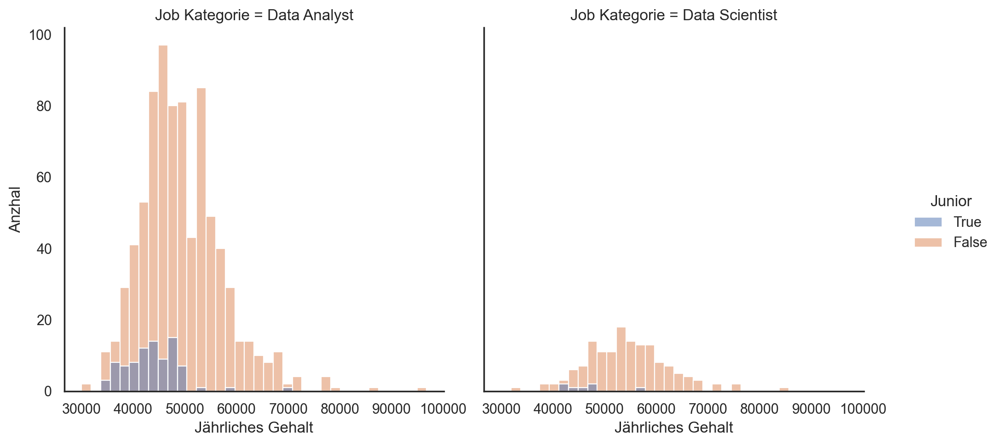

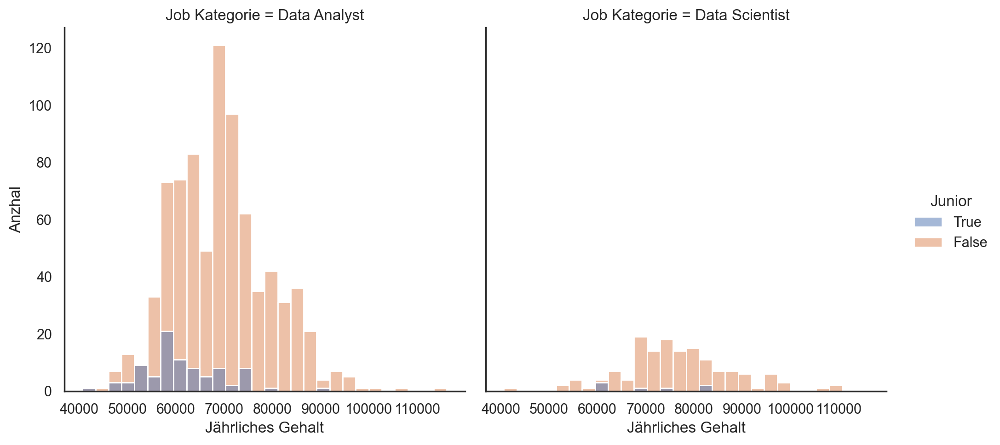

In [60]:
for gehalt in ["Gehalt_min_yearly", "Gehalt_max_yearly"]:
    g = sns.displot(
        data=jobs_scientist_analyst,
        x=gehalt,
        col="Job Kategorie",
        hue="Junior",
        hue_order=[True, False],
        kind="hist",
    )
    g.set(xlabel="Jährliches Gehalt", ylabel="Anzhal")
plt.show()

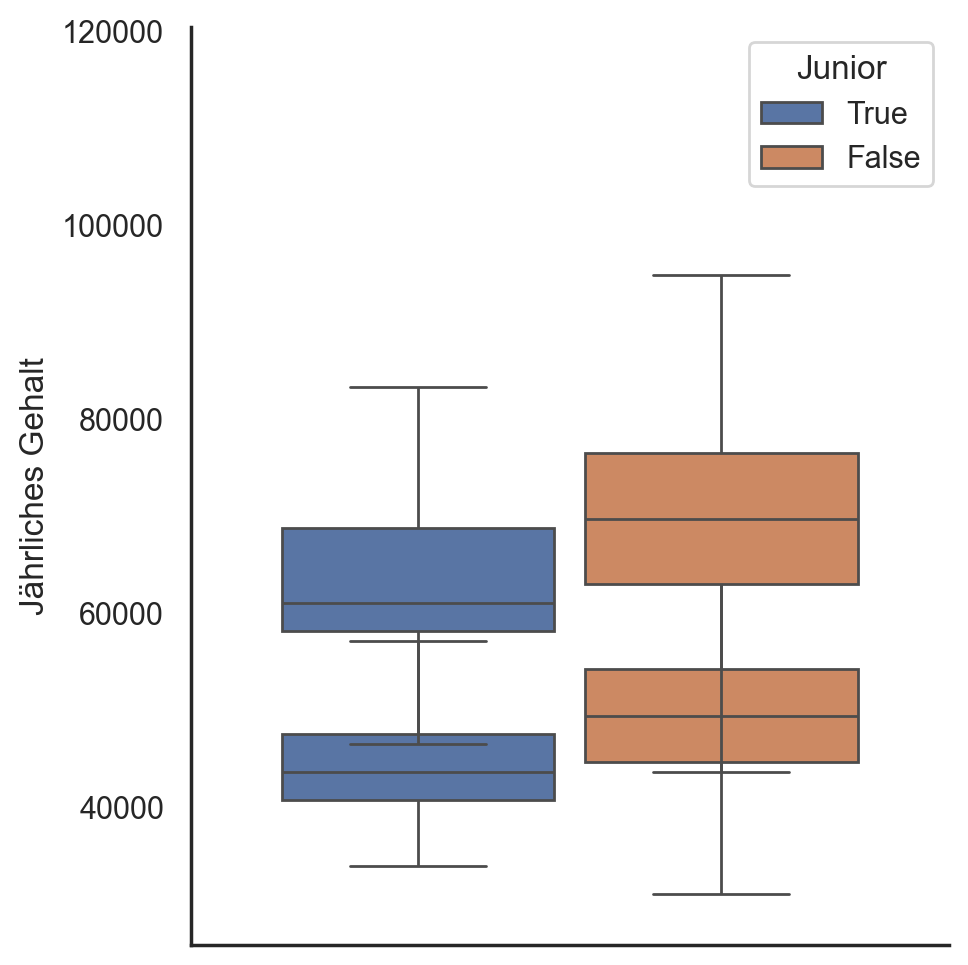

In [61]:
g = sns.catplot(
    data=jobs_scientist_analyst,
    y="Gehalt_min_yearly",
    hue="Junior",
    hue_order=[True, False],
    kind="box",
    gap=0.1,
    fliersize=0,
    legend=False,
)
h = sns.boxplot(
    data=jobs_scientist_analyst,
    y="Gehalt_max_yearly",
    hue="Junior",
    hue_order=[True, False],
    gap=0.1,
    fliersize=0,
)
g.set(ylabel="Jährliches Gehalt")

# g = sns.catplot(data=jobs_scientist_analyst, x="Gehalt_max_yearly", col="Job Kategorie", hue="Junior", kind="box")

plt.show()

### Durchschnittsgehalt

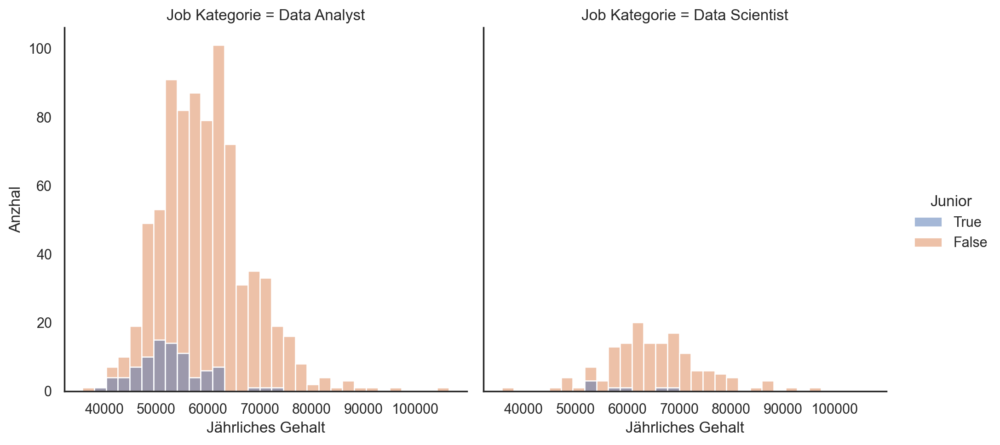

In [62]:
g = sns.displot(
    data=jobs_scientist_analyst,
    x="Gehalt_durchschnitt_yearly",
    col="Job Kategorie",
    hue="Junior",
    hue_order=[True, False],
    kind="hist",
)
g.set(xlabel="Jährliches Gehalt", ylabel="Anzhal")
plt.show()

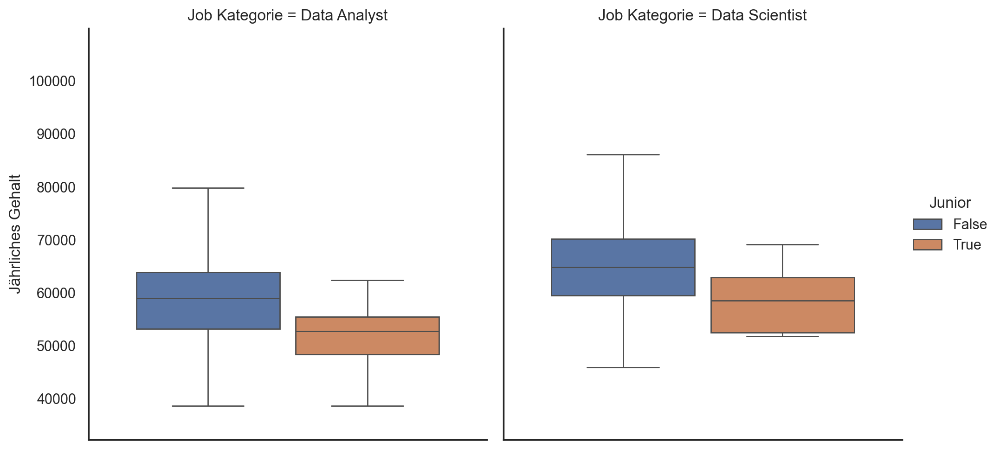

In [63]:
g = sns.catplot(
    data=jobs_scientist_analyst,
    y="Gehalt_durchschnitt_yearly",
    col="Job Kategorie",
    hue="Junior",
    kind="box",
    gap=0.1,
    fliersize=0,
)
g.set(ylabel="Jährliches Gehalt")
plt.show()

In [64]:
# jobs_scientist_analyst[(jobs_scientist_analyst["Gehalt_min"_yearly] < 35000) | (jobs_scientist_analyst["Gehalt_min"_yearly] > 75000)]

In [65]:
# jobs_scientist_analyst[(jobs_scientist_analyst["Gehalt_max"_yearly] < 50000) | (jobs_scientist_analyst["Gehalt_max"_yearly] > 100000)]

## Ort

In [66]:
# Nur Jobs, die nicht remote sind (so werden auch None Values einbezogen)
jobs_non_remote = jobs_scientist_analyst[jobs_scientist_analyst["Remote"] != True]  # noqa: E712

# Wenn Home Office angegeben ist, erstelle sie als remote
remote_list = ["home office", "home-office", "homeoffice", "fernbedienung"]


def remote(entry):
    for string in remote_list:
        if string in entry.lower():
            return True
    if entry.lower() == "bundesweit":
        return True
    else:
        return False


jobs_non_remote.loc[:, "Remote"] = jobs_non_remote["Ort"].apply(remote)

# Originaltabelle anpassen
jobs_scientist_analyst.loc[jobs_non_remote.index, "Remote"] = jobs_non_remote["Remote"]

In [67]:
# Cleaning
ersetzungen_orte = {
    ", de, \\d*": "",
    "alle standorte, ": "",
    "\\(.+?\)": "",
    " bei [^,]+": "",
    "\\d+": "",
    "\(|\)": "",
    "\\u200b": "",
    ", germany": "",
    "bundesweit( im)?": "",
    " am rhein": "",
    " am bodensee": "",
    "/ heidelberg": "",
    "Region": "",
    "D\-PLZ": "",
    "EMEA": "",
    "Donnerschweer Str.": "",
    "Potsdamer Platz": "",
    "Ingelheim": "Ingelheim am Rhein",
    "frankfurt/main|frankfurt a\.m\.|frankfurt a\. m\.": "Frankfurt am Main",
    "oberkochenoberkochen": "Oberkochen",
    "garching": "Garching b. München",
    "windach raum münchen": "Windach",
    "\\bberlin\\b": "Berlin",
    "Röthenbach a. d. Pegnitz / Metropol Nürnberg": "Röthenbach an der Pegnitz",
    "Luxembourg": "Luxemburg",
    "Heppenheim": "Heppenheim (Bergstraße)",
    "Sankt Katharinen": "Sankt Katharinen (Landkreis Neuwied)",
    "Ludwigshafen": "Ludwigshafen am Rhein",
    "Freiburg(?! )": "Freiburg im Breisgau",
    "Landsberg am Lech": "Landsberg a. Lech",
    "Bad Homburg(?! )|Bad Homburg vor der Höhe|Bad Homburg v. d. Höhe": "Bad Homburg v.d. Höhe",
    "Kempten": "Kempten (Allgäu)",
    "Flörsheim": "Flörsheim am Main",
    "Stuttgart - Fellbach": "Fellbach",
    "Home-Office|bundesweit|home office|homeoffice|fernbedienung|remote|Deutschlandweit": "",
    "Ottobrunn": "Ottobrunn/Riemerling",
    "München-Nord": "München",
    "Oberursel": "Oberursel (Taunus)",
    "Pullach": "Pullach i. Isartal",
    "Kästorf": "Gifhorn",
    "Aretsried": "Fischach",
    "Boppard-Buchholz": "Boppard",
    "Eschborn / Frankfurt": "Eschborn",
    "Abersloh": "Sendenhorst",
    "(Kirchdorf/)?Oberopfingen": "Kirchdorf an der Iller",
    "Lindau": "Lindau (Bodensee)",
    "Bergisch-Gladbach": "Bergisch Gladbach",
    "St. Leon-Rot": "Sankt Leon-Rot",
    "Spich": "Troisdorf",
    "Karlstadt-Stetten": "Stetten",
    "Fürstenwalde/Spree": "Fürstenwalde/ Spree",
    "Hauptverwaltung Düsseldorf": "Düsseldorf",
    "Bad Staffelstein": "Staffelstein",
    "Sonneborn": "Gotha",
    "Borken-Burlo": "Borken",
    "Gummersbach / Siegen": "Gummersbach,Siegen",
    "Mattighofen|Grevenmacher|Flawil|Obernai|Thayngen|Palma de Mallorca|Zürich|Paris|Salzburg|Innsbruck|Wien|Luxemburg|Schwabenheim an der Selz": "\g<0> (Ausland)",
}

staedte_list = jobs_scientist_analyst["Ort"]

for pattern, ersatz in ersetzungen_orte.items():
    staedte_list = staedte_list.str.replace(pattern, ersatz, regex=True, case=False)

# Einzelne Städte
multiple_staedte = staedte_list.str.contains(",| or | oder | und ", regex=True)
einzelne_staedte = staedte_list[~multiple_staedte]
multiple_staedte = staedte_list[multiple_staedte]

In [68]:
multiple_staedte = multiple_staedte.replace(r" or | oder | und ", ",", regex=True)
neue_staedte = []


def teilen(staedte):
    for stadt in staedte.split(","):
        neue_staedte.append(stadt)


multiple_staedte.apply(teilen)

staedte_cleaned = pd.concat(
    [einzelne_staedte, pd.Series(neue_staedte)], ignore_index=True
).str.strip()

staedte_cleaned.replace(r"\n", "", regex=True, inplace=True)
staedte_cleaned = staedte_cleaned[staedte_cleaned != ""]
staedte_cleaned.replace("Künzelsau", "Künzelsau, Ingelfingen", inplace=True)
staedte_cleaned.replace("Pirna", "Pirna, Struppen, Dohma", inplace=True)
staedte_cleaned.replace("Einbeck", "Einbeck, Kreiensen", inplace=True)
staedte_cleaned.replace(
    "Schwaig", "Schwaig b. Nürnberg, Behringersdorfer Forst", inplace=True
)
staedte_cleaned.replace("Bad Hersfeld", "Bad Hersfeld, Ludwigsau", inplace=True)

# staedte_cleaned

In [69]:
df_staedte = pd.DataFrame(data=staedte_cleaned.value_counts()).reset_index()
df_staedte.rename(columns={"index": "Stadt", "count": "Anzahl"}, inplace=True)
# df_staedte.head(20)

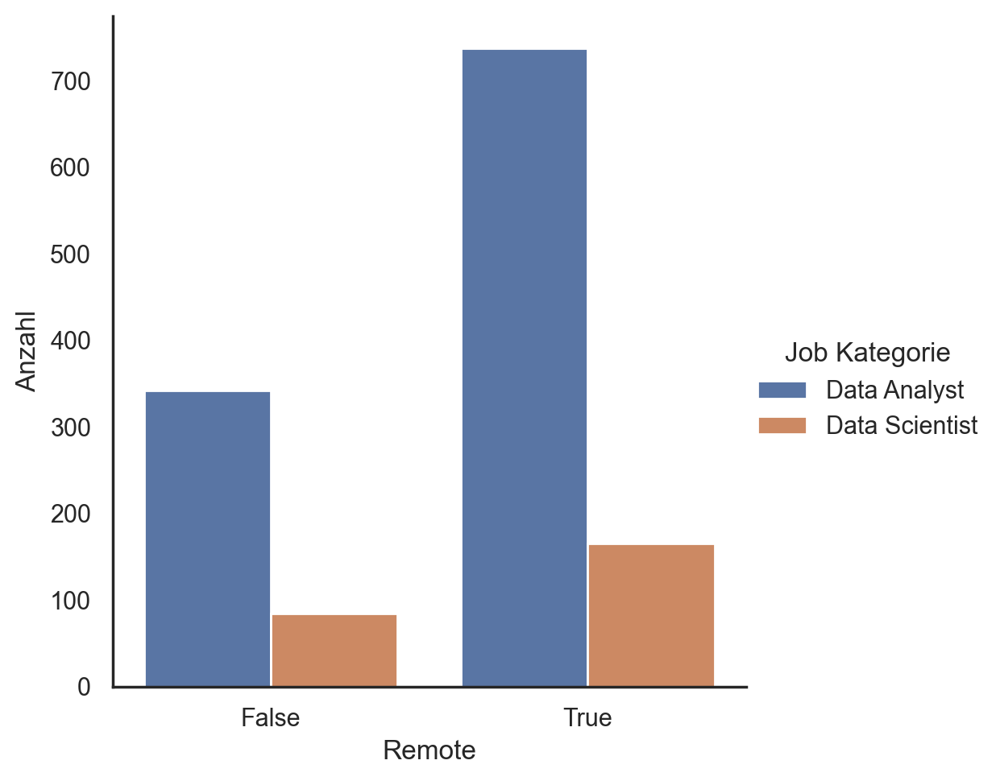

In [70]:
g = sns.catplot(
    data=jobs_scientist_analyst, x="Remote", kind="count", hue="Job Kategorie"
)
plt.ylabel("Anzahl")
plt.show()

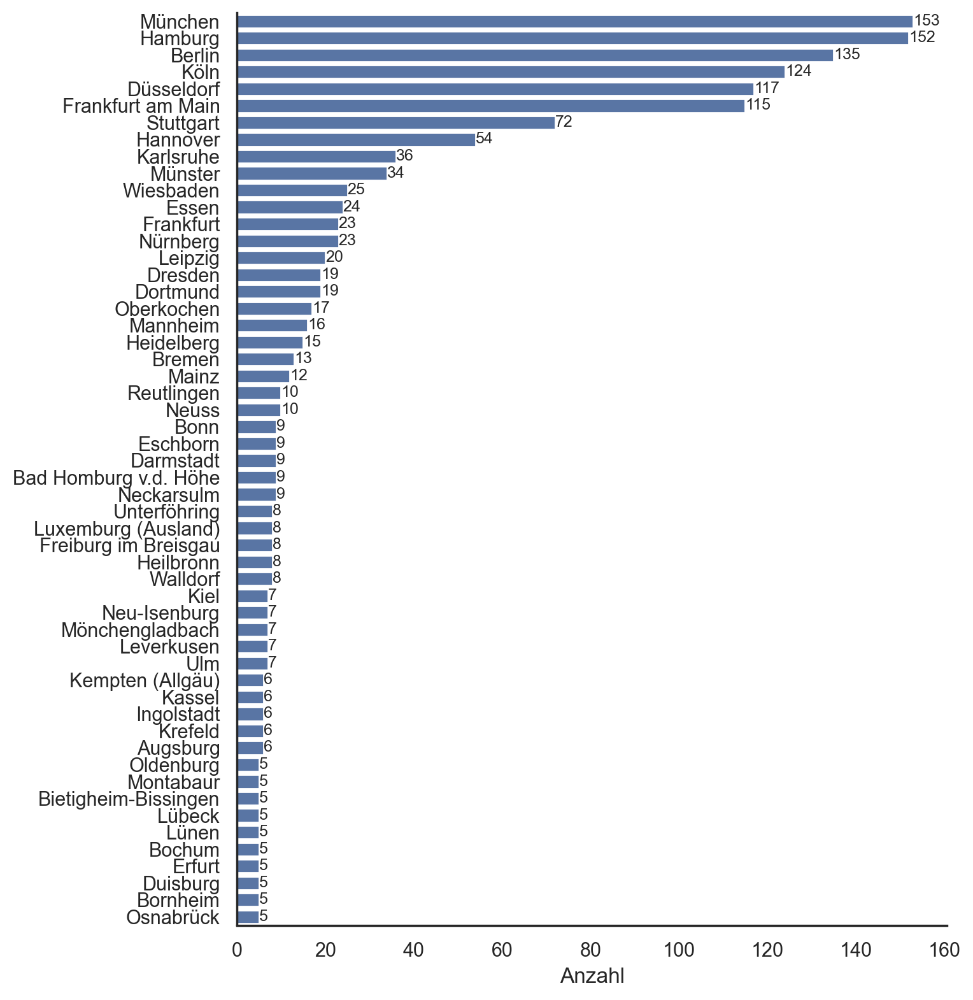

In [71]:
g = sns.catplot(
    data=df_staedte[df_staedte["Anzahl"] >= 5],
    y="Stadt",
    x="Anzahl",
    kind="bar",
    height=8,
)
ax = g.facet_axis(0, 0)
ax.bar_label(ax.containers[0], fontsize=9)
g.set(ylabel="")
plt.show()

In [72]:
gdf = geopandas.read_file("../Data Mining/data/geo_raw/krs/krs.shp")
gdf["krs_code"] = gdf.krs_code.astype("int")

kreise = pd.read_csv(
    "../Data Mining/data/geo_raw/georef-germany-postleitzahl.csv", delimiter=";"
)
kreise = kreise[["PLZ Name (short)", "Kreis code"]]
kreise.rename(
    {"PLZ Name (short)": "Stadt", "Kreis code": "krs_code"}, axis=1, inplace=True
)
kreise.drop_duplicates(subset="Stadt", inplace=True)

geo_kreise = kreise.merge(gdf, how="left", on="krs_code")

umlaute = {"Ã¤": "ä", "Ã¼": "ü", "Ã¶": "ö", "Ã\x9f": "ß"}
for key, value in umlaute.items():
    geo_kreise["krs_name"] = geo_kreise["krs_name"].str.replace(key, value)

# geo_kreise

In [73]:
jobs_with_geo = df_staedte.merge(geo_kreise, on="Stadt", how="left")
jobs_with_geo.dropna(subset=["geometry"], inplace=True)
geo_jobs = geopandas.GeoDataFrame(jobs_with_geo)

In [74]:
# Non matches

# geo_na = jobs_with_geo.loc[jobs_with_geo["geometry"].isna(), ["Stadt"]]

# for stadt in geo_na["Stadt"]:
# 	print(stadt)
# 	display(geo_kreise.loc[geo_kreise["Stadt"].str.contains(stadt), ["Stadt"]])
# 	display(geo_kreise.loc[geo_kreise["krs_name"].str.contains(stadt), ["krs_name"]])

In [75]:
# stadt = "Borken"
# display(geo_kreise.loc[geo_kreise["Stadt"].str.contains(stadt), ["Stadt"]])
# display(geo_kreise.loc[geo_kreise["krs_name"].str.contains(stadt), ["krs_name"]])

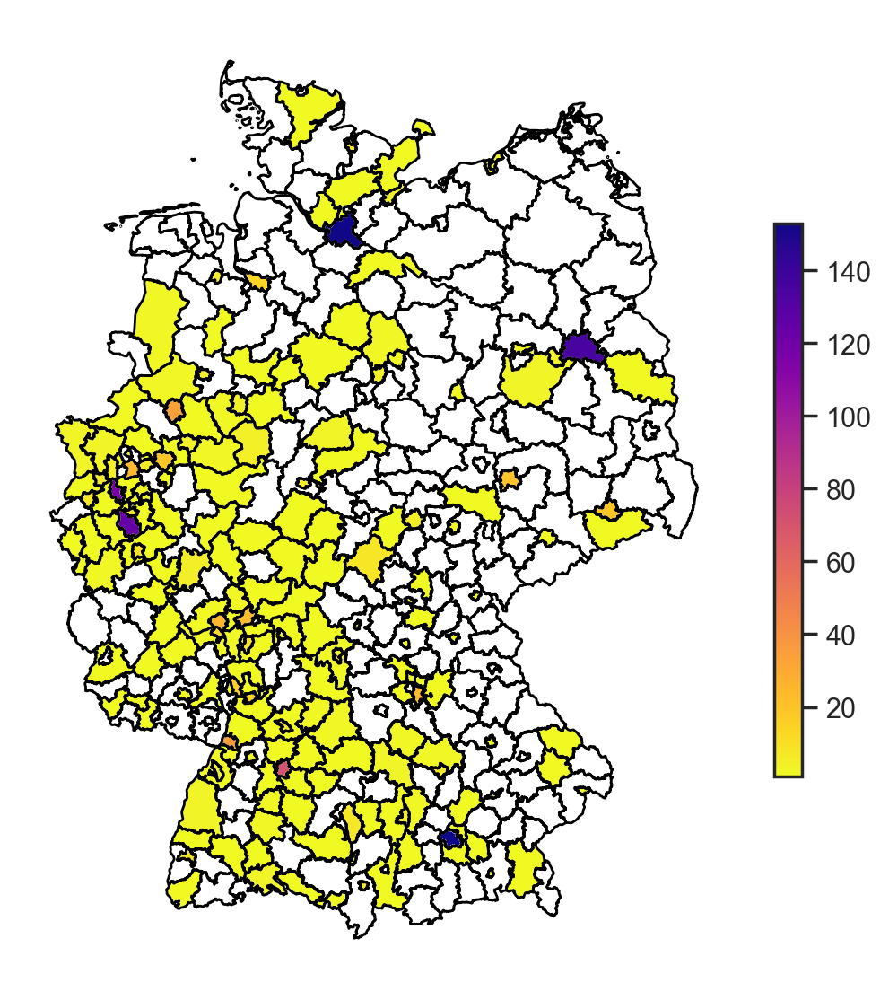

In [76]:
fig, ax = plt.subplots()
fig.set_figheight(8)
gdf.boundary.plot(linewidth=1, ax=ax, color="Black")
geo_jobs.plot(
    column="Anzahl", legend=True, legend_kwds={"shrink": 0.5}, ax=ax, cmap="plasma_r"
)
plt.axis("off")
plt.show()

In [77]:
geo_jobs.explore("Anzahl", cmap="plasma_r")

### Jobs in bestimmten Städten

In [78]:
jobs_scientist_analyst.loc[jobs_scientist_analyst["Ort"] == "Braunschweig"]

,Titel,Unternehmen,Ort,Gehalt_min,Gehalt_max,JobID,Link,Datum,Teilzeit_Remote,Introduction,...,Contact,Vollzeit,Teilzeit,Zeit flexibel,Remote,Job Kategorie,Junior,Gehalt_min_yearly,Gehalt_max_yearly,Gehalt_durchschnitt_yearly
4143,Business Intelligence Analyst (m/w/d),KOSATEC Computer GmbH,Braunschweig,3871,5161,57546707,https://www.stepstone.de/stellenangebote--busi...,2023-09-04,Vollzeit,KOSATEC beliefert im B2B-Geschäft über 8.000 K...,...,Wenn Du mit uns eine Delle ins Universum schla...,True,False,False,False,Data Analyst,False,46452,61932,54192.0
6492,Controller* Financial Plannung & Analysis,NEW YORKER,Braunschweig,<NA>,<NA>,57382300,https://www.stepstone.de/stellenangebote--cont...,2023-09-04,Vollzeit,Als inhabergeführtes Modeunternehmen mit weltw...,...,Bewirb Dich bitte über unser Online-Bewerbungs...,True,False,False,False,Data Analyst,False,<NA>,<NA>,<NA>
7509,Controller* Financial Planning & Analysis,NEW YORKER,Braunschweig,<NA>,<NA>,57721856,https://www.stepstone.de/stellenangebote--cont...,2023-09-22,Vollzeit,Unseren Erfolgskurs und das Wachstum lassen wi...,...,,True,False,False,False,Data Analyst,False,<NA>,<NA>,<NA>


Junior


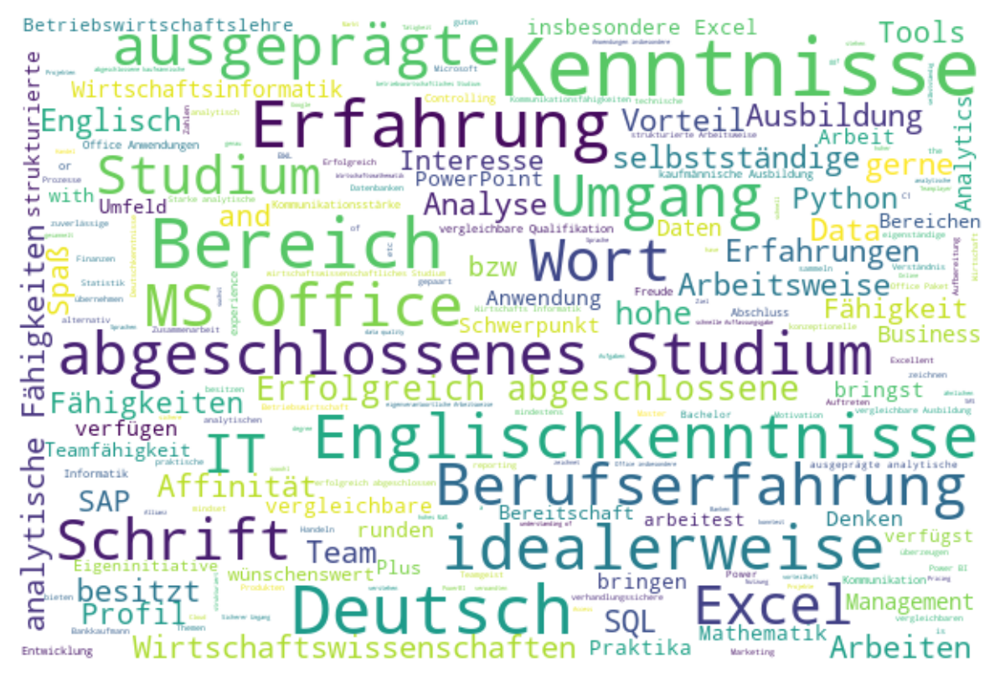

Nicht Junior


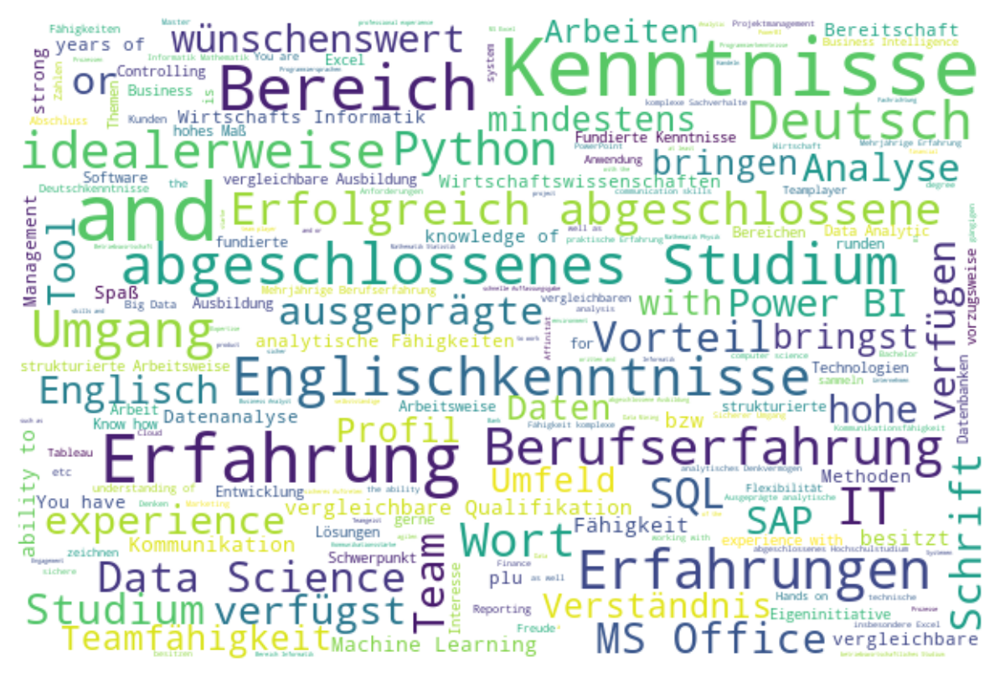

In [79]:
with open("stopwords-de.txt", "r") as file:
    stopwords = file.read().split()
for bool in [True, False]:
    print("{}Junior".format("Nicht " if bool is False else ""))
    text = " ".join(
        i
        for i in jobs_scientist_analyst.loc[
            jobs_scientist_analyst["Junior"] == bool, "Profile"
        ]
    )
    wordcloud = WordCloud(
        width=600,
        height=400,
        stopwords=stopwords,
        max_font_size=50,
        background_color="white",
        random_state=42,
    ).generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

# Trainee

In [80]:
trainee = jobs_relevant.loc[jobs_relevant["Job Kategorie"] == "Trainee", :]
print("{} Stellen".format(len(trainee)))

19 Stellen


In [81]:
# # Open all links
# from selenium import webdriver
# driver = webdriver.Firefox()
# for link in trainee["Link"]:
# 	driver.get(link)
# 	driver.switch_to.new_window('tab')

In [82]:
# driver.quit()

# Dump

In [83]:
# Clean Titles
regex = [
    ":\\((?:.*[/,\\-|_]){2}.+\\)",  # m/w/x etc
    ":\\([aA]ll.? [Gg].+\\)",  # alle geschlechter/gender
    ":\\([mM]ensch.?\\)",  # menschx
    ":[mwfd][/,\\-|_][mwfd][/,\\-|_][mwfd]",  # m,w,d etc
    ":\\([mwfd]+\\)",  # mwdf
    ":\\(all\\)",
    ":\\(\\*?[gn]*\\*?\\)",  # gn*
]

for gender in regex:
    jobs_relevant["Titel"] = jobs_relevant["Titel"].str.replace(gender, "", regex=True)

jobs_relevant["Titel"] = jobs_relevant["Titel"].str.strip()
jobs_relevant.groupby(
    "Titel",
).size().sort_values(ascending=False)

Titel
Business Analyst (m/w/d)                                                           34
Data Scientist (m/w/d)                                                             20
Data Engineer (m/w/d)                                                              19
Data Analyst (m/w/d)                                                               15
IT Business Analyst (m/w/d)                                                        13
                                                                                   ..
Data Science Manager (all genders)                                                  1
Data Science Experte (m/w/d), Performance- and Quality Management im Accounting     1
Data Science Engineer - Azure ML Services (w/m/d)                                   1
Data Relationship Manager Data Science & Solutions (m/w/d)                          1
werkstudent bi / datawarehouse (w/m/d)                                              1
Length: 2441, dtype: int64